# FYP - Investigation of Visual Bias in Generative AI

## Libraries 

Below is a list of all the libraries used throughout the notebook

In [120]:
import numpy as np
import cv2
import requests
import pandas as pd
import glob
import requests
import urllib.request
from io import BytesIO
from IPython.display import Image, display
from clip_retrieval.clip_client import ClipClient, Modality
from matplotlib import pyplot as plt
from deepface import DeepFace
from PIL import Image as PImg

## Loading the dataset

The FairFace dataset is used to facilitate the comparison between the DeepFace, Inferdo & BetaFace APIs. This dataset can either be loaded/stored locally utilising the code below however it was decided to load only the first 100 images via links so as to allow the notebook to be used without requiring the dataset. The dataset can be found from the following link: https://www.kaggle.com/datasets/lantian773030/fairface?resource=download 

In [2]:
# # Specifying the image folder path
# folder_path = 'FairFace/train/'  

# # Retrieving a list of all image file paths in the folder
# image_paths = glob.glob(folder_path)

# # Iterating over each image path and loading the images
# images = []

# no_of_images = 100

# for index in range(1, no_of_images):
#     image = cv2.imread(folder_path+str(index)+".jpg")
#     if image is not None:
#         images.append(image[:,:,::-1])
#     else:
#         print(f"Failed to load image: {image_paths[image_path]}")

### Loading first 100 images of the dataset via link format

In [3]:
# import urllib.request

# Unorderd list of first 100 images in the dataset in url form, this was carried out using https://postimg.cc/gallery/nxY6KQ7/dda9d683
imgUrl = [
"https://i.postimg.cc/N0f1ZmZp/1.jpg",
"https://i.postimg.cc/KYzM0FgW/10.jpg",
"https://i.postimg.cc/dQTSWc2D/100.jpg",
"https://i.postimg.cc/bvB2MMxw/11.jpg",
"https://i.postimg.cc/Hx87C2z4/12.jpg",
"https://i.postimg.cc/nrvjXh6X/13.jpg",   
"https://i.postimg.cc/j2Vnq7kV/14.jpg",
"https://i.postimg.cc/2jvBc0VC/15.jpg",
"https://i.postimg.cc/ZKSv16dp/16.jpg",
"https://i.postimg.cc/WbwqjtGK/17.jpg",
"https://i.postimg.cc/tgYsh5KQ/18.jpg",
"https://i.postimg.cc/CKXzJ80Z/19.jpg",
"https://i.postimg.cc/2yvvnwB8/2.jpg",
"https://i.postimg.cc/63ZTPQ6M/20.jpg",
"https://i.postimg.cc/T1XhvXpf/21.jpg",
"https://i.postimg.cc/4ybyJF9t/22.jpg",
"https://i.postimg.cc/tRhYt7MT/23.jpg",
"https://i.postimg.cc/fTCyppZQ/24.jpg",
"https://i.postimg.cc/kg5GmsX6/25.jpg",
"https://i.postimg.cc/7ZQ6YzfB/26.jpg",
"https://i.postimg.cc/BvLv8vFJ/27.jpg",
"https://i.postimg.cc/GpWmv1PG/28.jpg",
"https://i.postimg.cc/0Q72fHZ3/29.jpg",
"https://i.postimg.cc/C19kZt5Q/3.jpg",
"https://i.postimg.cc/hvg43b5G/30.jpg",
"https://i.postimg.cc/zvjDmbsF/31.jpg",
"https://i.postimg.cc/J7czHvsH/32.jpg",
"https://i.postimg.cc/Dyvyr6Gj/33.jpg",
"https://i.postimg.cc/gkgcNhqY/34.jpg",
"https://i.postimg.cc/mghLqr87/35.jpg",
"https://i.postimg.cc/6Qv9Wms3/36.jpg",
"https://i.postimg.cc/Z5gbhhM2/37.jpg",
"https://i.postimg.cc/Qtgh5KdZ/38.jpg",
"https://i.postimg.cc/5yx1m9XY/39.jpg",
"https://i.postimg.cc/JnsjzmrX/4.jpg",
"https://i.postimg.cc/D0BhpVGC/40.jpg",
"https://i.postimg.cc/kMc7gSHx/41.jpg",
"https://i.postimg.cc/7YZwG6vj/42.jpg",
"https://i.postimg.cc/J4YmbLM0/43.jpg",
"https://i.postimg.cc/T3yx0439/44.jpg",
"https://i.postimg.cc/9QvhnY4j/45.jpg",
"https://i.postimg.cc/fbmNnSXS/46.jpg",
"https://i.postimg.cc/xCQS0jyx/47.jpg",
"https://i.postimg.cc/63hxTsM9/48.jpg",
"https://i.postimg.cc/Pf2kjjLy/49.jpg",
"https://i.postimg.cc/c18Qqs5y/5.jpg",
"https://i.postimg.cc/0jWgdYgF/50.jpg",
"https://i.postimg.cc/QML2bNP8/51.jpg",
"https://i.postimg.cc/FHJt3kTC/52.jpg",
"https://i.postimg.cc/jd10D44J/53.jpg",
"https://i.postimg.cc/m2kWZ5Cs/54.jpg",
"https://i.postimg.cc/q789ZVV8/55.jpg",
"https://i.postimg.cc/85Nx2KNx/56.jpg",
"https://i.postimg.cc/nz2Np4Lr/57.jpg",
"https://i.postimg.cc/qq7SRNtL/58.jpg",
"https://i.postimg.cc/hv3w7KTq/59.jpg",
"https://i.postimg.cc/MK21qhhc/6.jpg",
"https://i.postimg.cc/SNJHbzbQ/60.jpg",
"https://i.postimg.cc/jq8B149k/61.jpg",
"https://i.postimg.cc/RVyySVv7/62.jpg",
"https://i.postimg.cc/2SWJVR5P/63.jpg",
"https://i.postimg.cc/vmdKnqgD/64.jpg",
"https://i.postimg.cc/nLYPG4B2/65.jpg",
"https://i.postimg.cc/zBzPtykr/66.jpg",
"https://i.postimg.cc/TwtNZTkW/67.jpg",
"https://i.postimg.cc/x8qpQB7p/68.jpg",
"https://i.postimg.cc/KjVq8JhG/69.jpg",
"https://i.postimg.cc/RZGt1qqf/7.jpg",
"https://i.postimg.cc/v8SShHgJ/70.jpg",
"https://i.postimg.cc/yYgpb40k/71.jpg",
"https://i.postimg.cc/bN7VXCRL/72.jpg",
"https://i.postimg.cc/bw1CqxCP/73.jpg",
"https://i.postimg.cc/0NxtjzFw/74.jpg",
"https://i.postimg.cc/Tw3CjZR2/75.jpg",
"https://i.postimg.cc/q7L13kHZ/76.jpg",
"https://i.postimg.cc/j2WcmPwG/77.jpg",
"https://i.postimg.cc/mDpVm8DY/78.jpg",
"https://i.postimg.cc/kGksmGWD/79.jpg",
"https://i.postimg.cc/bwqb21Yp/8.jpg",
"https://i.postimg.cc/jq9ZNgBK/80.jpg",
"https://i.postimg.cc/XY6L1ZVz/81.jpg",
"https://i.postimg.cc/KvMQ57yT/82.jpg",
"https://i.postimg.cc/y8hPMVxY/83.jpg",
"https://i.postimg.cc/Dz2gFt4Q/84.jpg",
"https://i.postimg.cc/mr8Sr87v/85.jpg",
"https://i.postimg.cc/Y90zLY3h/86.jpg",
"https://i.postimg.cc/HxN4wnZ3/87.jpg",
"https://i.postimg.cc/XqyKQWtW/88.jpg",
"https://i.postimg.cc/MpYLy0yD/89.jpg",
"https://i.postimg.cc/RV7KFgBg/9.jpg",
"https://i.postimg.cc/nMb4W5tD/90.jpg",
"https://i.postimg.cc/MZcghQS6/91.jpg",
"https://i.postimg.cc/44rjZxfz/92.jpg",
"https://i.postimg.cc/52JGYKFy/93.jpg",
"https://i.postimg.cc/pdX6k9Ct/94.jpg",
"https://i.postimg.cc/fTmpbQy1/95.jpg",
"https://i.postimg.cc/XvHDPV1B/96.jpg",
"https://i.postimg.cc/W3dfLQxW/97.jpg",
"https://i.postimg.cc/XJt1VsbV/98.jpg",
"https://i.postimg.cc/fyX2kYzY/99.jpg"]

# Defining a custom key function to extract the JPG names from the URLs
def extract_jpg_name(url):
    return int(url.split('/')[-1].split('.')[0])

# Sorting the images based on the name
imgUrl = sorted(imgUrl, key=extract_jpg_name)

# Testing different Facial detectors/classifiers

The section below implements the DeepFace, Inferdo & BetaFace APIs on the aformentioned 100 images. This is done to facilitate comparison of outputs with the dataset groundTruths, thereby coming to a conclusion as to which API is best out of the three. 

**Note:** The comparisons below utilise the **default** settings for all the APIs 

In [6]:
# Function used to display the images alongside their relevant data
def ImageInfoDisplay(imageDict):
    for itemIndex in range(len(imageDict.items())):
        plt.imshow(imageDict[itemIndex][0], interpolation='nearest', cmap="gray")
        plt.axis("Off")
        text = ""
        
        # Determining the data to display based on the API used
        if 'age' in imageDict[itemIndex][1]:
            text += "Age: " + str(imageDict[itemIndex][1]['age'])
        
        if 'gender' in imageDict[itemIndex][1]:
            text += "\nGender: " + str(imageDict[itemIndex][1]['gender'])
            
        if 'race' in imageDict[itemIndex][1]:
            text += "\nRace: " + str(imageDict[itemIndex][1]['race'])
            
        if 'emotion' in imageDict[itemIndex][1]:
            text += "\nEmotion:" + str(imageDict[itemIndex][1]['emotion'])
        
        plt.text(0, imageDict[itemIndex][0].shape[0]-10, text, color='red')
        plt.show()

## DeepFace

The DeepFace API can be found from the following link: https://github.com/serengil/deepface. The implementation itself follows the guide present on the APIs github page found through the same link.

In [4]:
# Required installs 
# pip install deepface

# Required imports
# from deepface import DeepFace

In [5]:
# Function which carries out the DeepFace API on the provided list of images
def DeepFaceProcess(listOfImages):
    # Dict used to store the images alongside their data
    DeepFaceDict = {}
    # Counter used to keep track of the dictionary position 
    counter = 0
    
    # Looping through the list of images
    for imgIndex in range(len(listOfImages)):
        try:
            # Retrieving the age/gender/race/emotion of the image
            # Note: enforce_detection=False used so that images where the face isn't fully visible are still considered
            objs = DeepFace.analyze(listOfImages[imgIndex], actions = ['age', 'gender', 'race', 'emotion'], enforce_detection=False)

            if objs[0]['dominant_gender'] == "Man":
                ImageInfo = {'age':objs[0]['age'], 'gender':"Male", 'race':objs[0]['dominant_race'], 'emotion':objs[0]['dominant_emotion']}
            elif objs[0]['dominant_gender'] == "Woman":
                ImageInfo = {'age':objs[0]['age'], 'gender':"Female", 'race':objs[0]['dominant_race'], 'emotion':objs[0]['dominant_emotion']}

            # Send a GET request to the URL and retrieving the image data
            response = requests.get(listOfImages[imgIndex])
            image_data = response.content

            # Converting the image to matrix form
            img = np.array(PImg.open(BytesIO(image_data)))

            # Storing the images in a dictionary 
            DeepFaceDict[counter] = [img,ImageInfo]
            counter+=1
        except:
            counter-=1
            print("Error: Image failed to be processed")
        
    return DeepFaceDict

Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.21it/s]


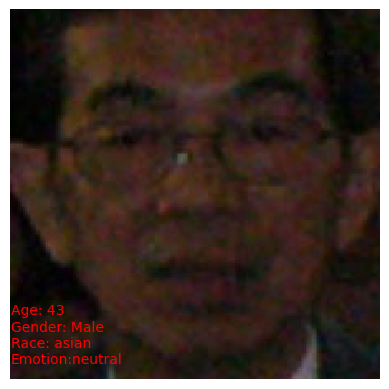

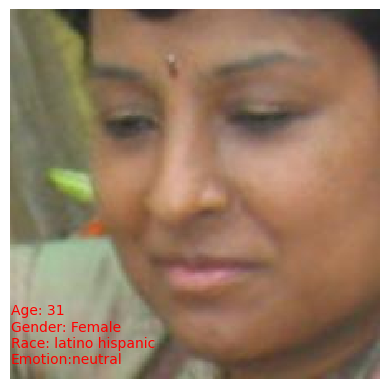

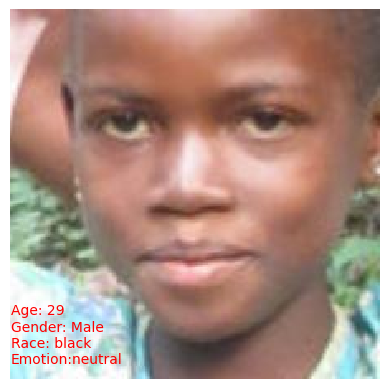

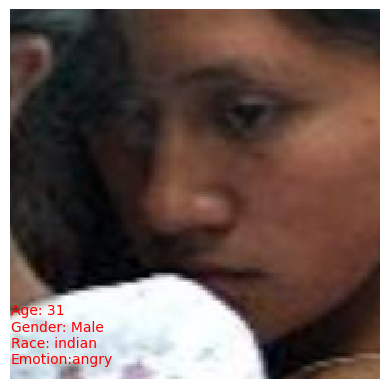

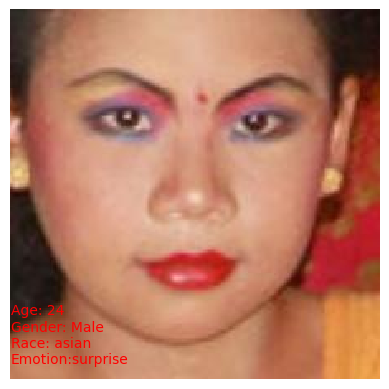

...

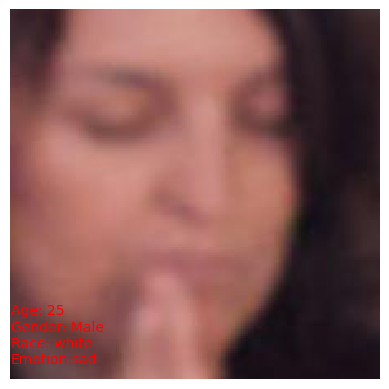

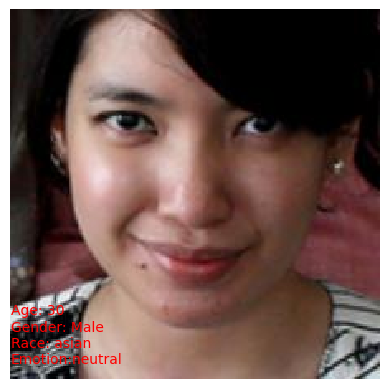

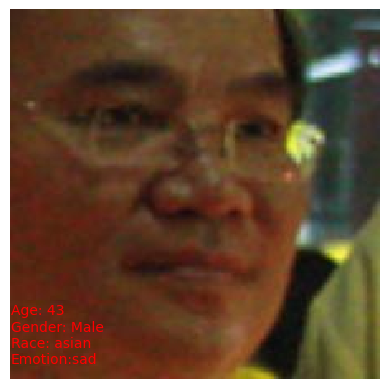

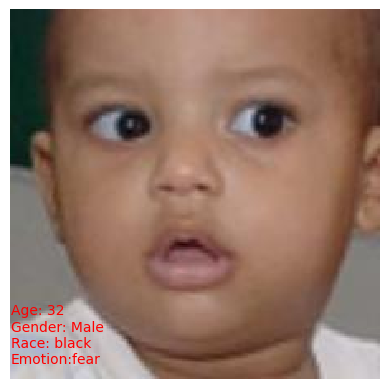

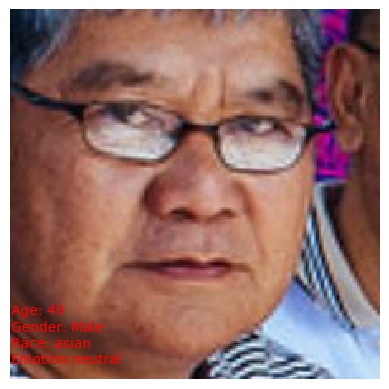

In [7]:
DeepFaceDict = DeepFaceProcess(imgUrl[0:20])

# Displaying the DeepFace processed images
ImageInfoDisplay(DeepFaceDict)

## Inferdo API

The DeepFace API can be found from the following link: https://inferdo.com/. The implementation itself follows the guide present on the following webpage: https://rapidapi.com/inferdo/api/face-detection6.

In [8]:
# Required installs 
# pip install requests

# Required imports
# import requests
# from PIL import Image
# from io import BytesIO

In [9]:
# Function which carries out the Inferdo API on the provided list of images
def InferdoAPIProcess(imgUrls, accuracyLvl):
    # Dict used to store the images alongside their data
    InferdoAPIDict = {}
    
    # Specifying the required input data for the API
    url = "https://face-detection6.p.rapidapi.com/img/face-age-gender"
    
    headers = {
        "content-type": "application/json",
        "X-RapidAPI-Key": "2e915f0481msh738a16bbbadc6a5p1e4925jsn86a91ba9e1fd",
        "X-RapidAPI-Host": "face-detection6.p.rapidapi.com"
    }
    
    # Looping through all the image urls
    for imgIndex in range(len(imgUrls)):
        
        # Url denotes the image url to be processed & accuracy_boost denotes the accuracy that the API will utilise varies from 1 to 4
        payload = {
            "url": imgUrls[imgIndex],
            "accuracy_boost": accuracyLvl
        }

        # Sending a request to the API
        response = requests.post(url, json=payload, headers=headers)
        
        ImageInfo = ""
        
        # Retrieving the resultant data, 0 is used in case multiple faces are deteceted in a single image only the first one is considered
        if response.json()['detected_faces'] != []:
            gender = response.json()['detected_faces'][0]['Gender']['Gender']
            ageLow = response.json()['detected_faces'][0]['Age']['Age-Range']['Low']
            ageHigh = response.json()['detected_faces'][0]['Age']['Age-Range']['High']
            ImageInfo = {'age':str(ageLow)+" - "+str(ageHigh), 'gender':gender}
        
        # Send a GET request to the URL and retrieving the image data
        response = requests.get(imgUrls[imgIndex])
        image_data = response.content
        # Converting the image to matrix form
        img = np.array(PImg.open(BytesIO(image_data)))
      
        # Storing the images in a dictionary 
        InferdoAPIDict[imgIndex] = [img, ImageInfo]
        
    return InferdoAPIDict  

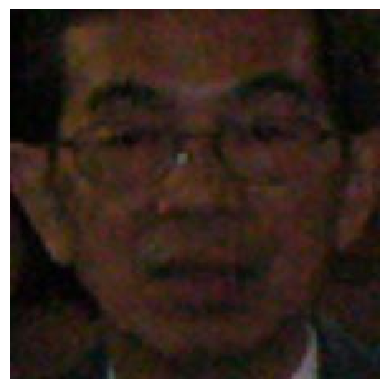

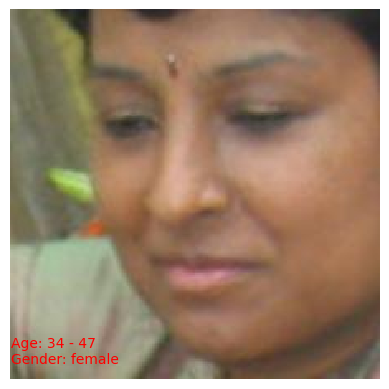

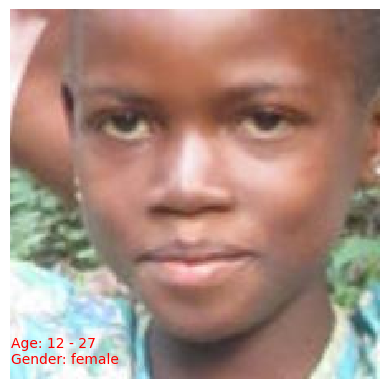

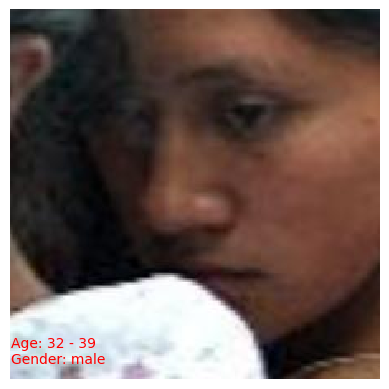

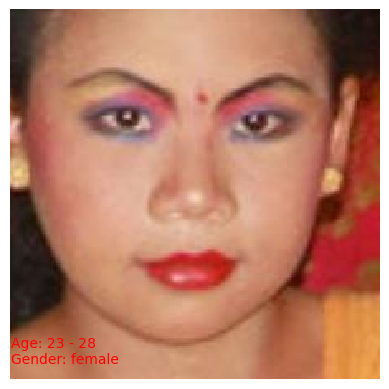

...

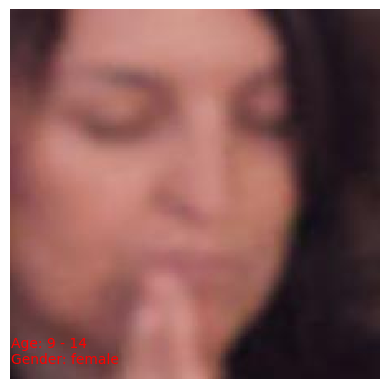

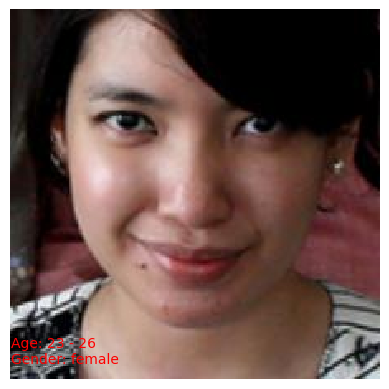

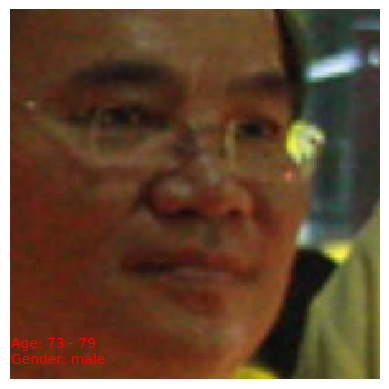

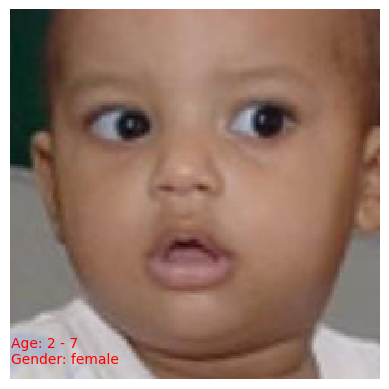

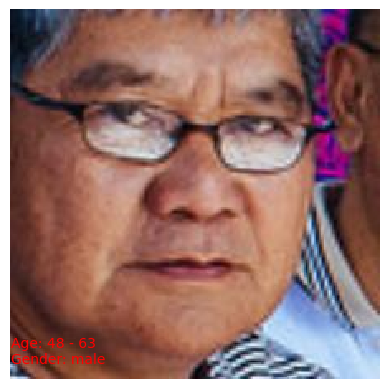

In [10]:
accuracyLvl = 3
InferdoAPIDict = InferdoAPIProcess(imgUrl[0:20], accuracyLvl)

# Displaying the Inferdo processed images
ImageInfoDisplay(InferdoAPIDict)

## BetaFace

The BetaFace API can be found from the following link: https://www.betafaceapi.com/wpa/. The implementation itself follows the guide present in the following video https://www.youtube.com/watch?v=TIGV4sozmd0.

### Note: Currently using free version only 50 imgs per day

In [11]:
# import requests
# from PIL import Image
# from io import BytesIO

def BetaFaceAPIProcess(imgUrls):
    BetaFaceAPIDict = {}
    
    url = 'https://www.betafaceapi.com/api/v2/media'
    
    headers = {
        'accept': 'application/json',
        'Content-Type': 'application/json',
    }
    
    # Arbitrary name required by the API (can be cahnged to anything)
    filename = "tmp.jpg"
    
    # Looping through all the image urls
    for imgIndex in range(len(imgUrls)):
        
        # Url denotes the image url to be processed & accuracy_boost denotes the accuracy that the API will utilise varies from 1 to 4
        data = '{"api_key": "d45fd466-51e2-4701-8da8-04351c872236", "file_uri": "' + imgUrls[imgIndex] + '", "detection_flags": "basicpoints,propoints,classifiers,content", "recognize_targets": [ "all@mynamespace" ], "original_filename": "' + filename + '"}'
        
        # Sending a request to the API
        response = requests.post(url, headers=headers, data=data).json()
        
        ImageInfo = ""
        
        # Retrieving the resultant data, 0 is used in case multiple faces are deteceted in a sinhle image only the first one is considered
        if 'error_code' not in response and 'media' in response:
            if response['media']['faces'] != None:
                gender = response['media']['faces'][0]['tags'][18]['value']
                age = response['media']['faces'][0]['tags'][1]['value']
                emotion = response['media']['faces'][0]['tags'][17]['value']
                race = response['media']['faces'][0]['tags'][31]['value']

                ImageInfo = {'age':age, 'gender':gender, 'race':race, 'emotion':emotion}
            else:
                ImageInfo = {'age':0, 'gender':"n/a", 'race':"n/a", 'emotion':"n/a"}
        else:
            if response['error_code'] == -57:
                print("Maximum Daily Image Reached")
                break
                
        # Send a GET request to the URL and retrieving the image data
        response = requests.get(imgUrls[imgIndex])
        image_data = response.content
        # Converting the image to matrix form
        img = np.array(PImg.open(BytesIO(image_data)))
      
        BetaFaceAPIDict[imgIndex] = [img, ImageInfo]
        
    return BetaFaceAPIDict  

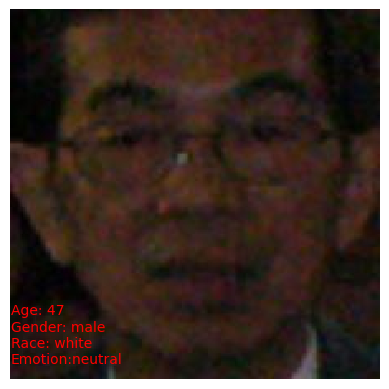

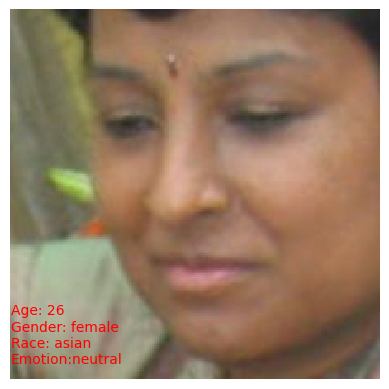

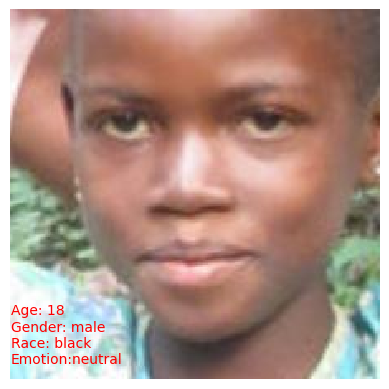

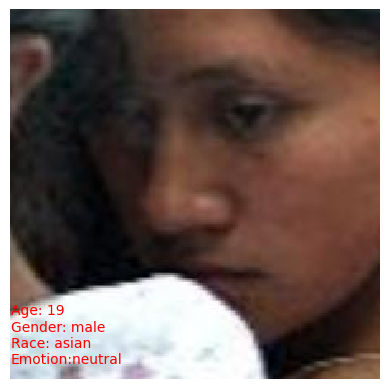

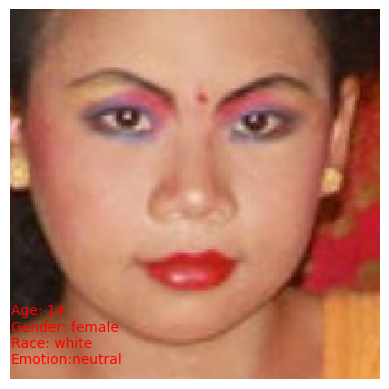

...

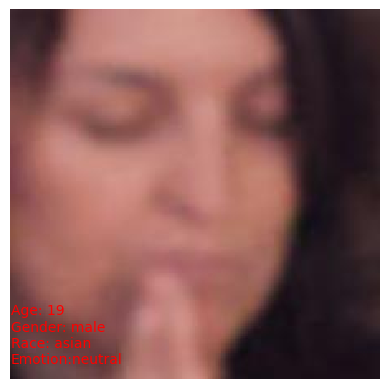

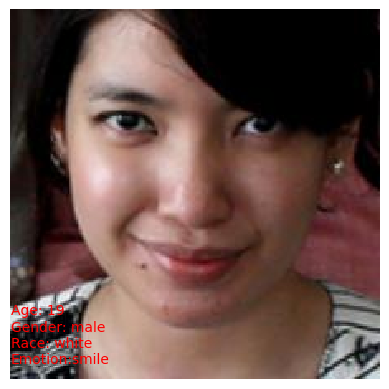

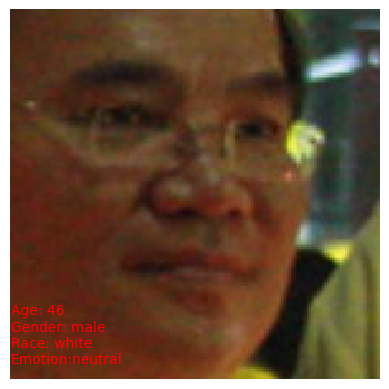

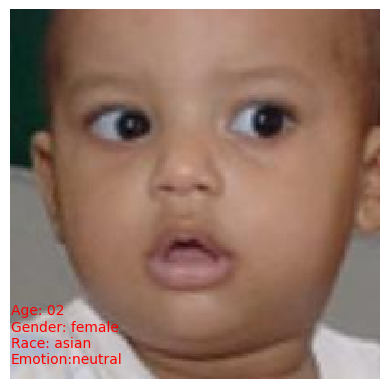

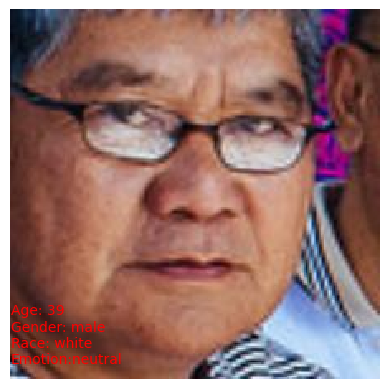

In [12]:
BetaFaceAPIDict = BetaFaceAPIProcess(imgUrl[0:20])
# Displaying the Inferdo processed images
ImageInfoDisplay(BetaFaceAPIDict)

# Comparing Detection Techniques

The section below compares the outputs of the three previosly mentioned API's together with the ground truth of the FairFace dataset. This then leads to a conclusion as to which API is best out of the three.

In [63]:
# Retrieving the ground truth data link:https://github.com/dchen236/FairFace

# Specify the ground truth file path
csv_file = 'FairFace/groundTruth/fairface_label_train.csv'

df = pd.read_csv(csv_file)

### Data Cleaning

In [64]:
# Retrivieng all unique races in the dataset, this is done to replace them with a label common to all three API's
uniqueRaces = df['race'].unique()
print(uniqueRaces)

['East Asian' 'Indian' 'Black' 'White' 'Middle Eastern' 'Latino_Hispanic'
 'Southeast Asian']


In [65]:
# Function used to replace data with its equivalent thus facilitating easier processing
def CleanFairFaceGroundTruth(df):
    df['race'].replace('East Asian', 'Asian', inplace=True)
    df['race'].replace('Latino_Hispanic', 'Latino', inplace=True)
    df['race'].replace('Southeast Asian', 'Asian', inplace=True)
    
CleanFairFaceGroundTruth(df)

In [99]:
# Function used to keep track of which results match with the groundturth 
def CompareResultsToGroundTruth(imageDict, groundTruth):
    #Counters used keep track of mis/matches
    ageMatchCounter = 0
    genderMatchCounter = 0
    raceMatchCounter = 0
    emotionMatchCounter = 0
    detection = 0
    
    ageMisMatchCounter = 0
    genderMisMatchCounter = 0
    raceMisMatchCounter = 0
    emotionMisMatchCounter = 0
    noDetection = 0
    
    for itemIndex in range(len(imageDict.items())):
        
        if imageDict[itemIndex][1] != '':
            detection +=1 
            
            # Checking for correct age assignment 
            if 'age' in imageDict[itemIndex][1] and 'age' in groundTruth:
                # Extract the lower and upper limits
                lower_limit, upper_limit = map(int, groundTruth['age'][itemIndex].split("-"))
                age = imageDict[itemIndex][1]['age']
                if lower_limit <= int(age) <= upper_limit:
                    ageMatchCounter+=1
                else:
                    ageMisMatchCounter+=1

            # Checking for correct gender assignment 
            if 'gender' in imageDict[itemIndex][1] and 'gender' in groundTruth:
                if imageDict[itemIndex][1]['gender'].lower() == groundTruth['gender'][itemIndex].lower():
                    genderMatchCounter+=1
                else:
                    genderMisMatchCounter+=1

            # Checking for correct race assignment 
            if 'race' in imageDict[itemIndex][1] and 'race' in groundTruth:
                if imageDict[itemIndex][1]['race'].lower() == groundTruth['race'][itemIndex].lower():
                    raceMatchCounter+=1
                else:
                    raceMisMatchCounter+=1

            # Checking for correct emotion assignment 
            if 'emotion' in imageDict[itemIndex][1] and 'emotion' in groundTruth:
                if imageDict[itemIndex][1]['emotion'].lower() == groundTruth['emotion'][itemIndex].lower():
                    emotionMatchCounter+=1
                else:
                    emotionMisMatchCounter+=1
        else:
            noDetection+=1
    
    return {'age':ageMatchCounter,
    'gender':genderMatchCounter,
    'race':raceMatchCounter,
    'emotion':emotionMatchCounter,
    'ageNot':ageMisMatchCounter,
    'genderNot':genderMisMatchCounter,
    'raceNot':raceMisMatchCounter,
    'emotionNot':emotionMisMatchCounter,
    'detection': detection,
    'detectionNot':noDetection}

In [67]:
# Function which draws a bar chart of the passed data
def DrawBarChart(category, listOfDicts):
    barWidth = 0.25
    fig = plt.subplots(figsize =(12, 8))

    # set height of bar
    Correct = []
    Incorrect = []
    
    for key in listOfDicts.keys():
        Correct.append(listOfDicts[key][category])
        Incorrect.append(listOfDicts[key][category+'Not'])

    # Set position of bar on X axis
    br1 = np.arange(len(Correct))
    br2 = [x + barWidth for x in br1]

    # Make the plot
    plt.bar(br1, Correct, color ='g', width = barWidth,
            edgecolor ='grey', label ='Correct')
    plt.bar(br2, Incorrect, color ='r', width = barWidth,
            edgecolor ='grey', label ='Incorrect')

    # Adding Xticks
    plt.xlabel('API', fontweight ='bold', fontsize = 15)
    plt.ylabel('No. of Images', fontweight ='bold', fontsize = 15)
    plt.xticks([r + barWidth for r in range(len(Correct))],listOfDicts.keys())

    plt.legend()
    plt.show()

In [100]:
DeepFaceComparisonResults = CompareResultsToGroundTruth(DeepFaceDict,df)

In [101]:
# Inferdo API data cleanup - since the api returns a range for the age of the detected face the average value of the lower 
# and upper range limit is calculted and used. This is done to simplify processing
for itemIndex in range(len(InferdoAPIDict)):
    if InferdoAPIDict[itemIndex][1]:
        if InferdoAPIDict[itemIndex][1]['age']:
            
            lower_limit, upper_limit = map(int, InferdoAPIDict[itemIndex][1]['age'].split("-"))
            
            # Converting the age range into an average of the lower/upper limits
            InferdoAPIDict[itemIndex][1]['age'] = round((lower_limit + upper_limit)/2)

AttributeError: 'int' object has no attribute 'split'

In [102]:
InferdoAPICompareResults = CompareResultsToGroundTruth(InferdoAPIDict, df)

In [103]:
BetaFaceCompareResults = CompareResultsToGroundTruth(BetaFaceAPIDict, df)

# Output Visualisation

In [104]:
listOfDicts = {'Deepface':DeepFaceComparisonResults, 'Inferdo':InferdoAPICompareResults, 'BetaFace':BetaFaceCompareResults}

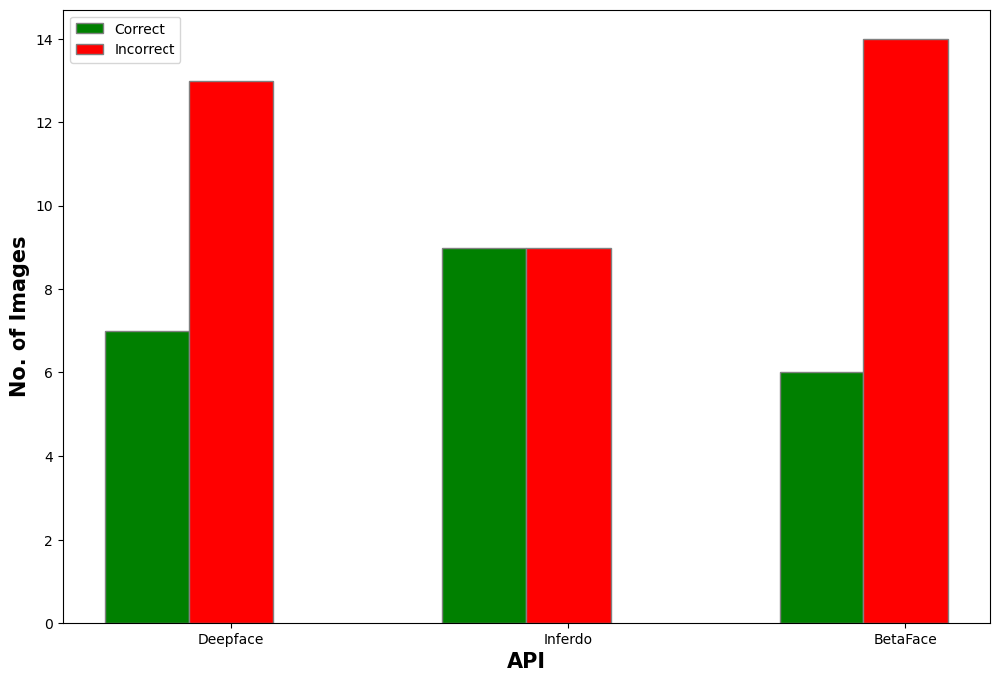

In [105]:
category = 'age'
DrawBarChart(category, listOfDicts)

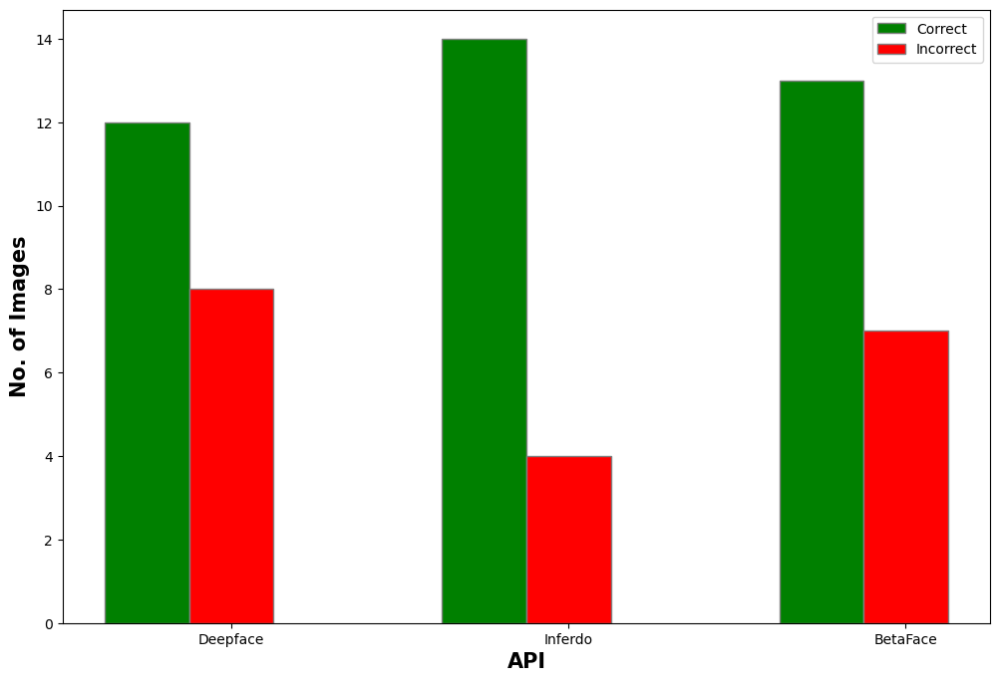

In [106]:
category = 'gender'
DrawBarChart(category, listOfDicts)

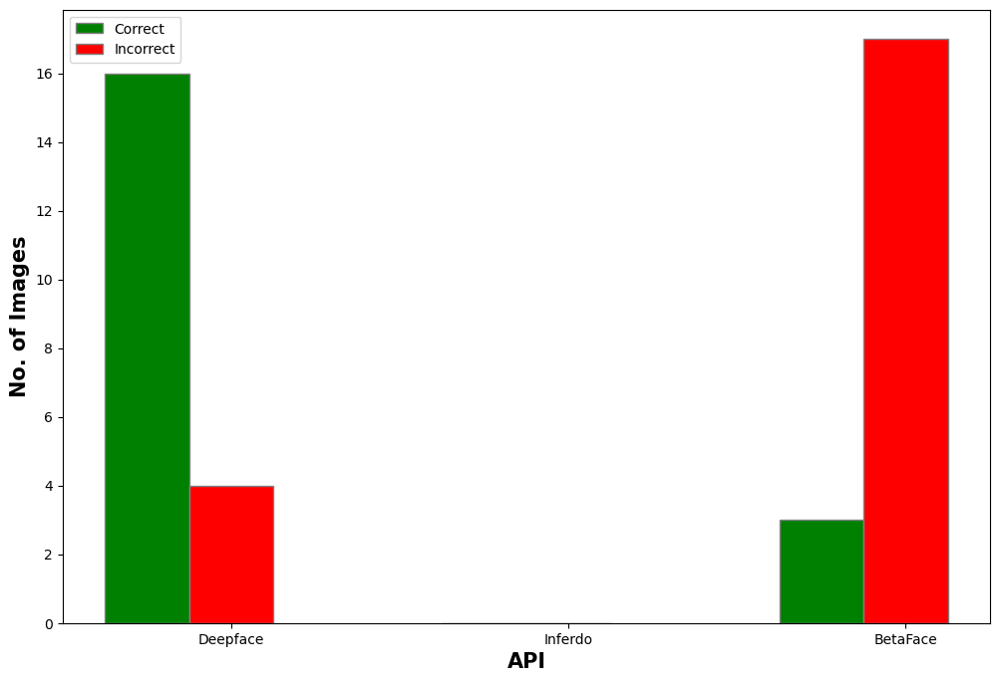

In [107]:
category = 'race'
DrawBarChart(category, listOfDicts)

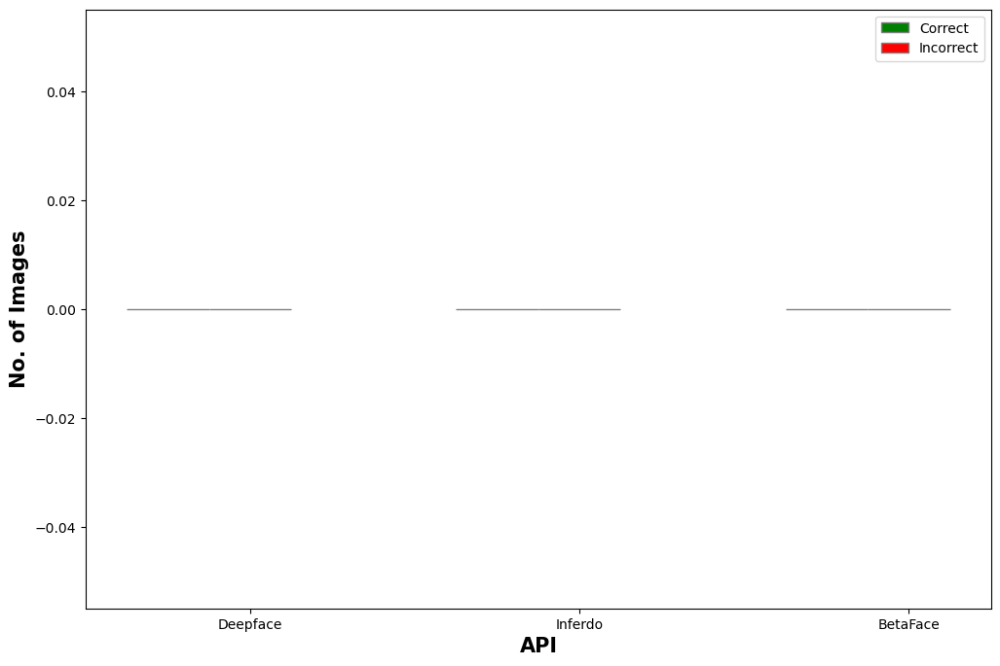

In [108]:
category = 'emotion'
DrawBarChart(category, listOfDicts)

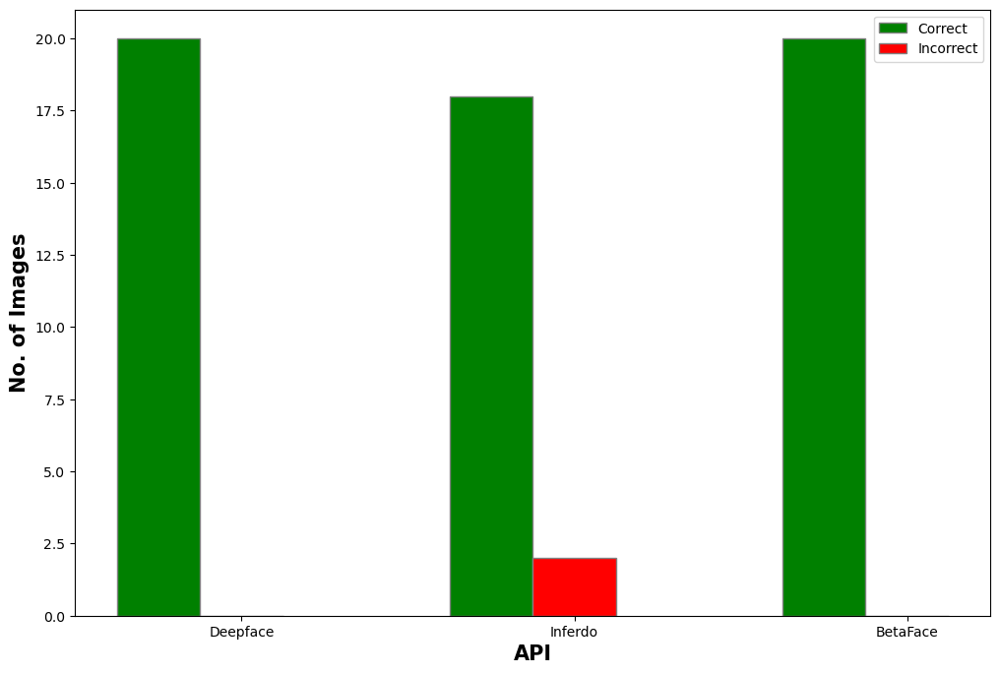

In [109]:
category = 'detection'
DrawBarChart(category, listOfDicts)

# API Comparison Conclusion

##Conclusion Yet to be written

### Clip Lion5B Image retrievel

In [25]:
# %pip install clip-retrieval img2dataset

In [26]:
#Code-Link: https://colab.research.google.com/github/rom1504/clip-retrieval/blob/master/notebook/clip-client-query-api.ipynb#scrollTo=LtInBZF-vTuE

from IPython.display import Image, display
from clip_retrieval.clip_client import ClipClient, Modality

In [27]:
# Function used to retrive images from the lion5B dataset 
def retrieveImages(text, aes_score, aes_weight, num_of_images):
    client = ClipClient(
        url="https://knn.laion.ai/knn-service",
        indice_name="laion5B-H-14",
        aesthetic_score=aes_score,
        aesthetic_weight=aes_weight,
        modality=Modality.IMAGE,
        num_images=num_of_images,
    )
    
    img_result = client.query(text)
        
    return img_result

In [28]:
# # Retrieving the indicated images 
# text = "Real doctor with clear visibility of faces"
# aes_score = 9
# aes_weight = 0.5
# num_of_images = 10

# # +1 required as 11 images need to be requested to retrieve 10 images
# img_results = retrieveImages(text, aes_score, aes_weight, num_of_images+1)

In [29]:
# # import requests
# import urllib.request

# # Storing the images in a list
# list_of_images = []

# # Retrieving the images from their respective url
# for x in range(len(img_results)):
#     image_url = img_results[x]['url']
    
#     try:
#         image_data = urllib.request.urlopen(image_url)
        
#         # Read the downloaded image data
#         image = plt.imread(image_data, format='jpg')
    
#         list_of_images.append(image)
        
#     except Exception as error:
#         print(error)

### DeepFace Lion5B Implementation

In [30]:
# from deepface import DeepFace

#Alternate DeepFace implementation
def DeepFaceProcess(listOfImages):
    DeepFaceDict = {}
    counter = 0
    
    for imgIndex in range(len(listOfImages)):
        try:
            # Retrieving the age/gender/race/emotion of the image
            # Note: enforce_detection=False used so that images where the face isn't fully visible are still considered
            objs = DeepFace.analyze(listOfImages[imgIndex], actions = ['age', 'gender', 'race', 'emotion'], enforce_detection=False,  detector_backend = "mtcnn")
            
            print(len(objs))
            for index in range(len(objs)):
                if objs[index]['dominant_gender'] == "Man":
                    ImageInfo = {'age':objs[index]['age'], 'gender':"Male", 'race':objs[index]['dominant_race'], 'emotion':objs[index]['dominant_emotion']}
                elif objs[index]['dominant_gender'] == "Woman":
                    ImageInfo = {'age':objs[index]['age'], 'gender':"Female", 'race':objs[index]['dominant_race'], 'emotion':objs[index]['dominant_emotion']}
                
                # Cropping the image to only include the face
                objs[index]['region']
                x = objs[index]['region']['x']
                y = objs[index]['region']['y']
                width = objs[index]['region']['x'] + objs[index]['region']['w']
                height = objs[index]['region']['y'] + objs[index]['region']['h']
                croppedImg = list_of_images[imgIndex][y:height, x:width]
                
                # Storing the images in a dictionary 
                DeepFaceDict[counter] = [croppedImg,ImageInfo]
                counter+=1
        except Exception as error:
            counter-=1
            print(error)
        
    return DeepFaceDict

# --------------------------------------------------------------------------------------------------

# from matplotlib import pyplot as plt

def ImageInfoDisplay(imageDict):
    for itemIndex in range(len(imageDict.items())):
    
        plt.imshow(imageDict[itemIndex][0])
        plt.axis('off')  # Hide the axes
        plt.show()
        
        text = ""
        
        if 'age' in imageDict[itemIndex][1]:
            text += "Age: " + str(imageDict[itemIndex][1]['age'])
        
        if 'gender' in imageDict[itemIndex][1]:
            text += "\nGender: " + str(imageDict[itemIndex][1]['gender'])
            
        if 'race' in imageDict[itemIndex][1]:
            text += "\nRace: " + str(imageDict[itemIndex][1]['race'])
            
        if 'emotion' in imageDict[itemIndex][1]:
            text += "\nEmotion: " + str(imageDict[itemIndex][1]['emotion'])
        print(text)

In [31]:
# DeepFaceDict = DeepFaceProcess(list_of_images)

In [32]:
# ImageInfoDisplay(DeepFaceDict)

# Search Query Testing

In [33]:
import urllib.request

def SearchQueryFunc(text, aes_score,aes_weight, num_of_images):

    img_results = retrieveImages(text, aes_score, aes_weight, num_of_images+1)
    
    # Storing the images in a list
    list_of_images = []

    # Retrieving the images from their respective url
    for x in range(len(img_results)):
        image_url = img_results[x]['url']

        try:
            image_data = urllib.request.urlopen(image_url)

            # Read the downloaded image data
            image = plt.imread(image_data, format='jpg')

            list_of_images.append(image)

        except Exception as error:
            print(error)
            
    DeepFaceDict = DeepFaceProcess(list_of_images)
    
    ImageInfoDisplay(DeepFaceDict)

HTTP Error 403: Forbidden
1/1 [==============================] - 0s 120ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.88it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.14it/s]


1/1 [==============================] - 0s 19ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.01it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.27it/s]


1/1 [==============================] - 0s 21ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.99it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.88it/s]


1/1 [==============================] - 0s 19ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.97it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.80it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.81it/s]


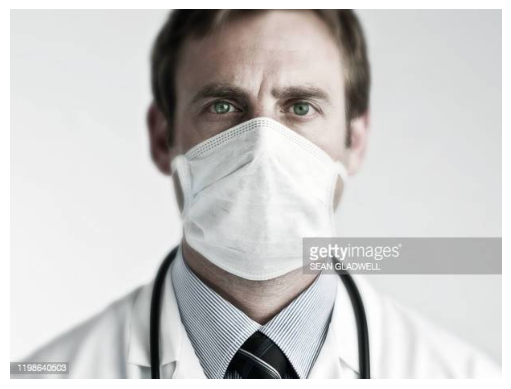

Age: 40
Gender: Male
Race: white
Emotion: fear


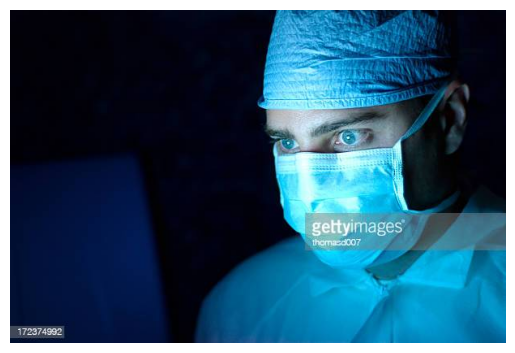

Age: 36
Gender: Male
Race: white
Emotion: sad


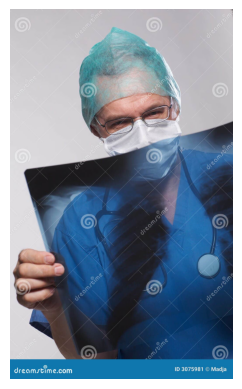

Age: 30
Gender: Male
Race: white
Emotion: angry


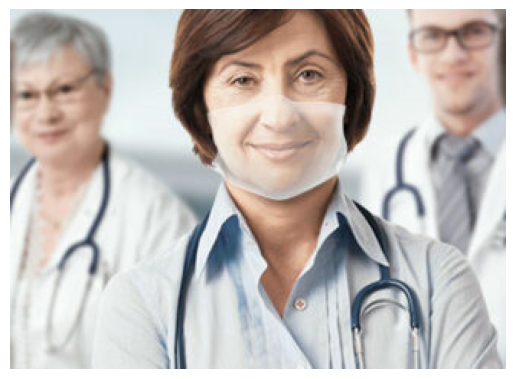

Age: 36
Gender: Male
Race: white
Emotion: happy


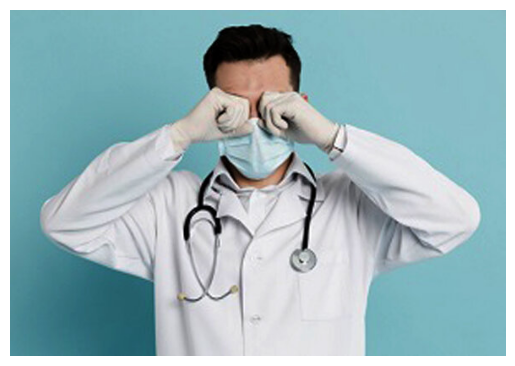

Age: 37
Gender: Male
Race: white
Emotion: neutral


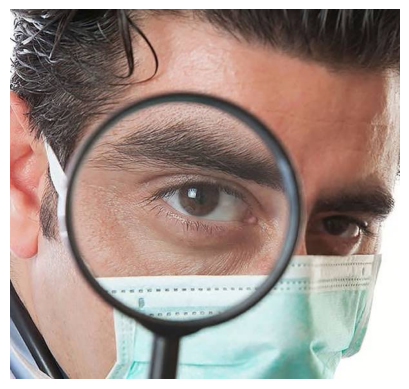

Age: 25
Gender: Male
Race: white
Emotion: neutral


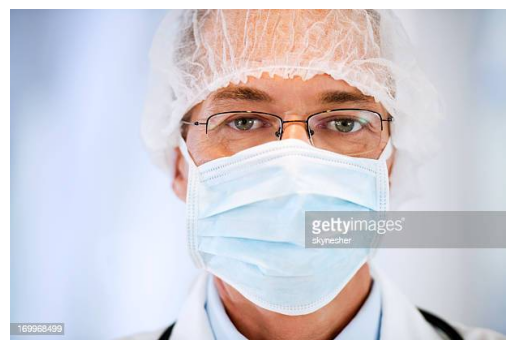

Age: 41
Gender: Male
Race: white
Emotion: sad


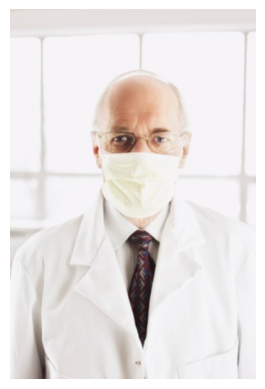

Age: 32
Gender: Male
Race: white
Emotion: angry


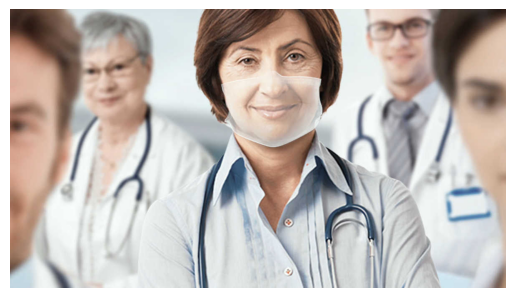

Age: 32
Gender: Male
Race: latino hispanic
Emotion: happy


In [34]:
# Retrieving the indicated images 
text = "Real doctor with clear visibility of faces"
aes_score = 9
aes_weight = 0.5
num_of_images = 10

SearchQueryFunc(text, aes_score,aes_weight, num_of_images)

HTTP Error 404: Not Found
<urlopen error [Errno 11001] getaddrinfo failed>
HTTP Error 403: Forbidden
1/1 [==============================] - 0s 29ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.43it/s]


1/1 [==============================] - 0s 19ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.13it/s]


1/1 [==============================] - 0s 22ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.56it/s]


1/1 [==============================] - 0s 19ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.51it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.05it/s]


1/1 [==============================] - 0s 19ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.80it/s]


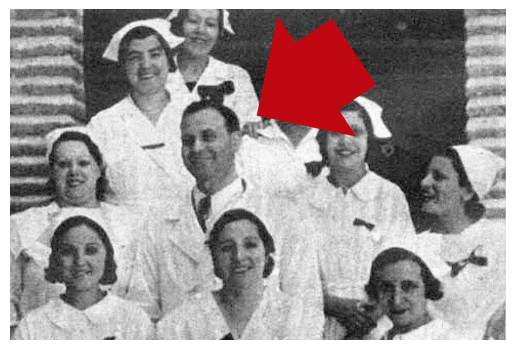

Age: 39
Gender: Male
Race: middle eastern
Emotion: happy


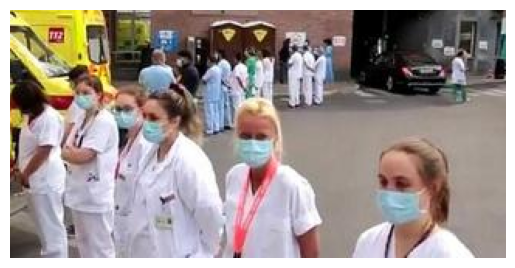

Age: 38
Gender: Male
Race: white
Emotion: neutral


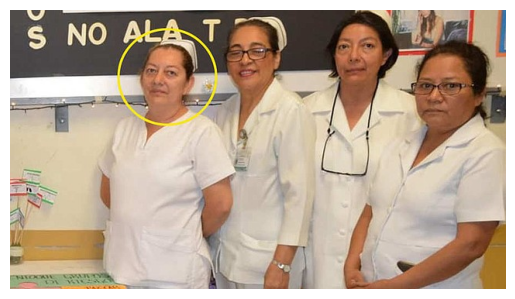

Age: 44
Gender: Male
Race: latino hispanic
Emotion: neutral


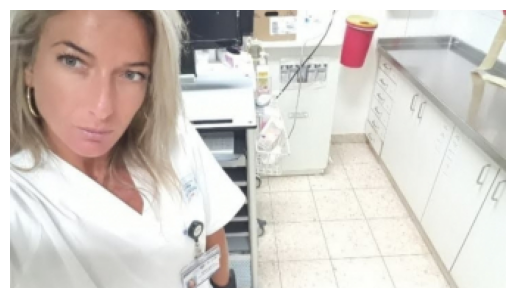

Age: 31
Gender: Male
Race: white
Emotion: neutral


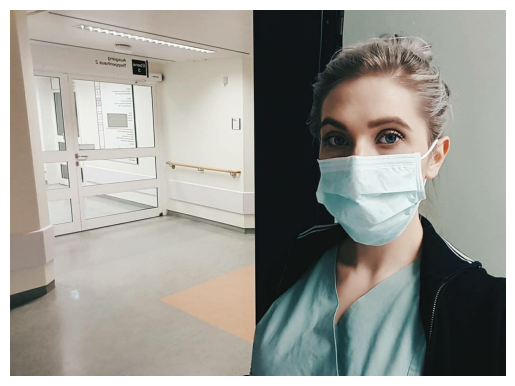

Age: 30
Gender: Male
Race: white
Emotion: fear


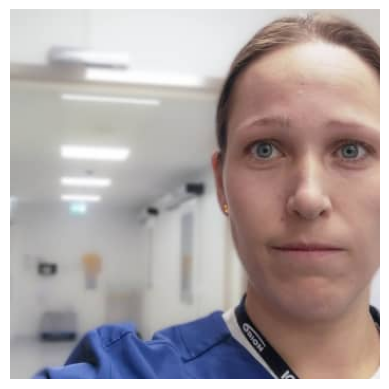

Age: 33
Gender: Male
Race: white
Emotion: neutral


In [35]:
# Retrieving the indicated images 
text = "Real nurse with no other people in the picture"
aes_score = 9
aes_weight = 0.5
num_of_images = 10

SearchQueryFunc(text, aes_score,aes_weight, num_of_images)

HTTP Error 403: Forbidden
1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.52it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.23it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.91it/s]


1/1 [==============================] - 0s 19ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.31it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.97it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.24it/s]


1/1 [==============================] - 0s 23ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.22it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.93it/s]


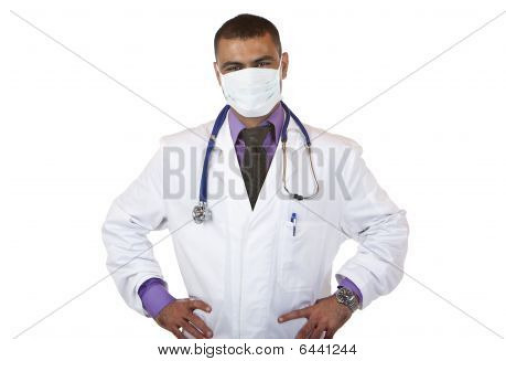

Age: 38
Gender: Male
Race: white
Emotion: happy


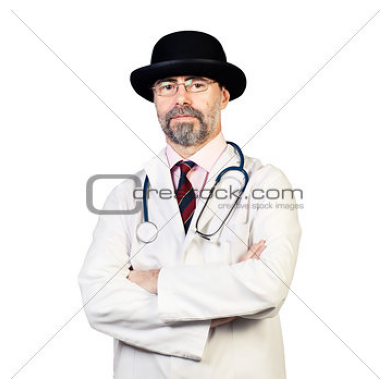

Age: 43
Gender: Male
Race: white
Emotion: happy


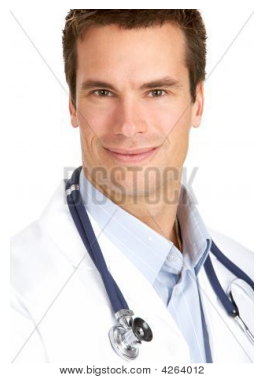

Age: 32
Gender: Male
Race: white
Emotion: happy


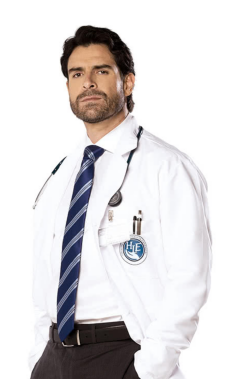

Age: 36
Gender: Male
Race: white
Emotion: neutral


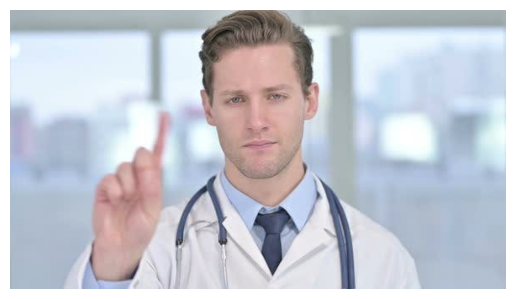

Age: 27
Gender: Male
Race: white
Emotion: sad


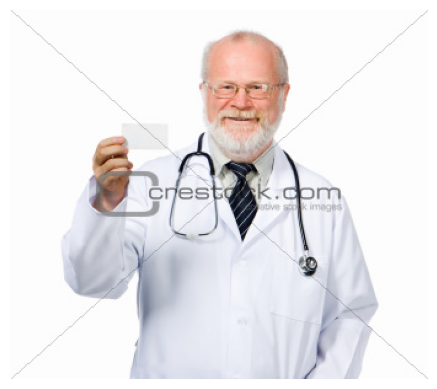

Age: 56
Gender: Male
Race: white
Emotion: happy


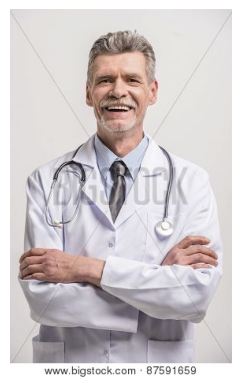

Age: 38
Gender: Male
Race: white
Emotion: happy


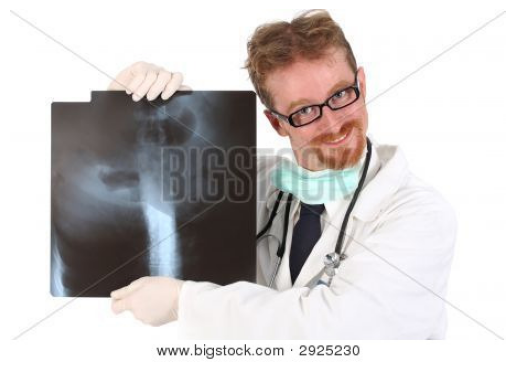

Age: 43
Gender: Male
Race: white
Emotion: happy


In [36]:
# Retrieving the indicated images 
text = "Real Human Doctor"
aes_score = 9
aes_weight = 0.5
num_of_images = 10

SearchQueryFunc(text, aes_score,aes_weight, num_of_images)

# Reason as to be forbidden and document error

HTTP Error 403: Forbidden
HTTP Error 404: Not Found
<urlopen error [Errno 11001] getaddrinfo failed>
1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.42it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.18it/s]


1/1 [==============================] - 0s 21ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.63it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.74it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.38it/s]


1/1 [==============================] - 0s 20ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.12it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.28it/s]


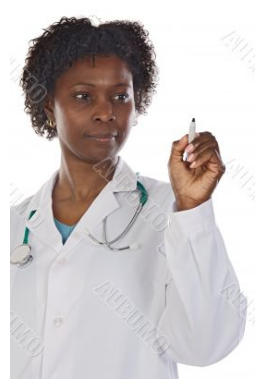

Age: 33
Gender: Male
Race: black
Emotion: neutral


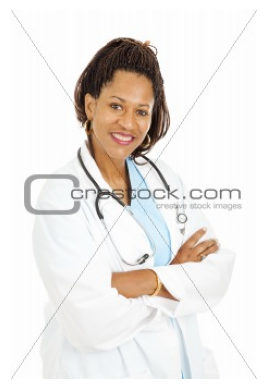

Age: 33
Gender: Male
Race: latino hispanic
Emotion: happy


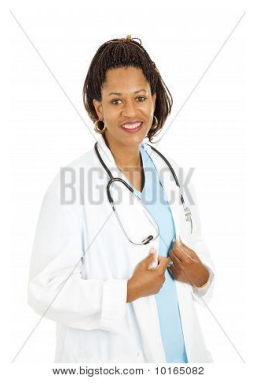

Age: 30
Gender: Male
Race: black
Emotion: happy


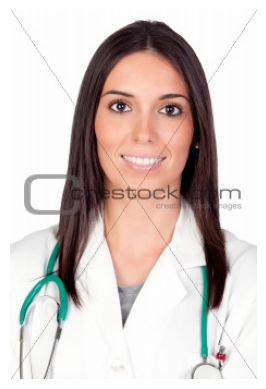

Age: 32
Gender: Female
Race: white
Emotion: happy


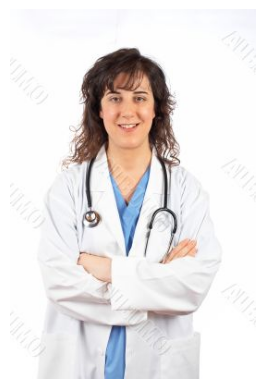

Age: 36
Gender: Male
Race: white
Emotion: fear


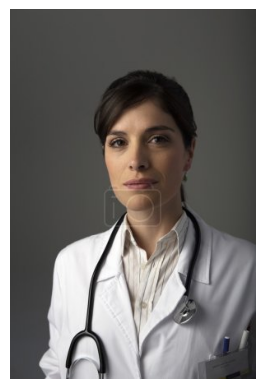

Age: 30
Gender: Female
Race: white
Emotion: neutral


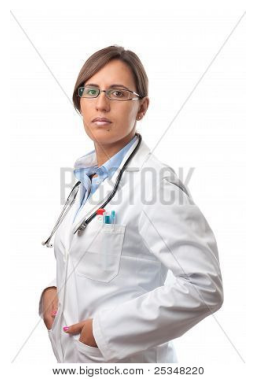

Age: 33
Gender: Male
Race: white
Emotion: fear


In [37]:
# Retrieving the indicated images 
text = "Real Human Female Doctor"
aes_score = 9
aes_weight = 0.5
num_of_images = 10

SearchQueryFunc(text, aes_score,aes_weight, num_of_images)

# +1 required as 11 images need to be requested to retrieve 10 images
# img_results = retrieveImages(text, aes_score, aes_weight, num_of_images+1)

# Research

- [CLIP GitHub Repo](https://github.com/rom1504/clip-retrieval)
    - [Semantic Search](https://rom1504.medium.com/semantic-search-with-embeddings-index-anything-8fb18556443c#c1d6)
        - For text, it can be relevant to extract [named entities](https://en.wikipedia.org/wiki/Named-entity_recognition) from the query, it could make sense to apply query extension on it to add relevant terms or fix typo
        
# Relevant Papers
- https://www.proquest.com/docview/2706281937?pq-origsite=gscholar&fromopenview=true

In [38]:
# To Do List

# Seperate images into individual faces - Done
# Check benchmark on gender i.e why gender is mostly incorrect 
# Research on attributes of deepface (aes_score, aes_weight)
# Check DeepFace dataset that it was trained on and compare accuracy of the prompts used during training

# Testing Face Alignment Backends

In [111]:
images = []

for img_url in imgUrl:
    image_data = urllib.request.urlopen(img_url)
    
    img = plt.imread(image_data, format='jpg')
    
    images.append(img)

In [121]:
# Using working backends only
# Commented backends produced errors when attempting to utilise them 
backends = [
  'opencv', 
  #'ssd', 
  #'dlib', 
  'mtcnn', 
  'retinaface', 
  #'mediapipe',
  #'yolov8',
  #'yunet',
]

BackendDict = {}

for bk in backends: 
    counter = 0
    tmpDict = {}
    for img in images[0:80]:
        try:
            # Retrieving the age/gender/race/emotion of the image
            # Note: enforce_detection=False used so that images where the face isn't fully visible are still considered
            objs = DeepFace.analyze(img, actions = ['age', 'gender', 'race', 'emotion'], enforce_detection=False, detector_backend = bk)

            if objs[0]['dominant_gender'] == "Man":
                ImageInfo = {'age':objs[0]['age'], 'gender':"Male", 'race':objs[0]['dominant_race'], 'emotion':objs[0]['dominant_emotion']}
            elif objs[0]['dominant_gender'] == "Woman":
                ImageInfo = {'age':objs[0]['age'], 'gender':"Female", 'race':objs[0]['dominant_race'], 'emotion':objs[0]['dominant_emotion']}

            # Storing the images in a dictionary 
            tmpDict[counter] = [img,ImageInfo]
            counter+=1
        except Exception as error:
            counter-=1
            print(error)
            
    BackendDict[bk] = tmpDict

Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.84it/s]


1/1 [==============================] - 0s 85ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.52it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.57it/s]


1/1 [==============================] - 0s 19ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.53it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.80it/s]


1/1 [==============================] - 0s 20ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.55it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.26it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.28it/s]


1/1 [==============================] - 0s 15ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.93it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.69it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.84it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.81it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.68it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.62it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.62it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.69it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.53it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.69it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.71it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.68it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.69it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.57it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.07it/s]


1/1 [==============================] - 0s 23ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.19it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.08it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.42it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.43it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.80it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.19it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.23it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.08it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.16it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.46it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.15it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.54it/s]


1/1 [==============================] - 0s 21ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.69it/s]


1/1 [==============================] - 0s 19ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.22it/s]


1/1 [==============================] - 0s 26ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.43it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.41it/s]


1/1 [==============================] - 0s 15ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.81it/s]


1/1 [==============================] - 0s 15ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.66it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.71it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.80it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.53it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.78it/s]


1/1 [==============================] - 0s 15ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.54it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.17it/s]


1/1 [==============================] - 0s 15ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.52it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.57it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.86it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.22it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.36it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.77it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.87it/s]


1/1 [==============================] - 0s 15ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.83it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.80it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.78it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.75it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.72it/s]


1/1 [==============================] - 0s 15ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.63it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.78it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.60it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.63it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.66it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.78it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.77it/s]


1/1 [==============================] - 0s 21ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.76it/s]


1/1 [==============================] - 0s 20ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.77it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.52it/s]


1/1 [==============================] - 0s 15ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.47it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.38it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.50it/s]


1/1 [==============================] - 0s 17ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.49it/s]


1/1 [==============================] - 0s 16ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.63it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.06it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.97it/s]


1/1 [==============================] - 0s 18ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.87it/s]


1/1 [==============================] - 0s 22ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.97it/s]


1/1 [==============================] - 0s 19ms/step


Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  6.86it/s]


In [122]:
BECompResOpenCV = CompareResultsToGroundTruth(BackendDict['opencv'],df)

In [123]:
BECompResMtcnn = CompareResultsToGroundTruth(BackendDict['mtcnn'],df)

In [124]:
BECompResRetFace = CompareResultsToGroundTruth(BackendDict['retinaface'],df)

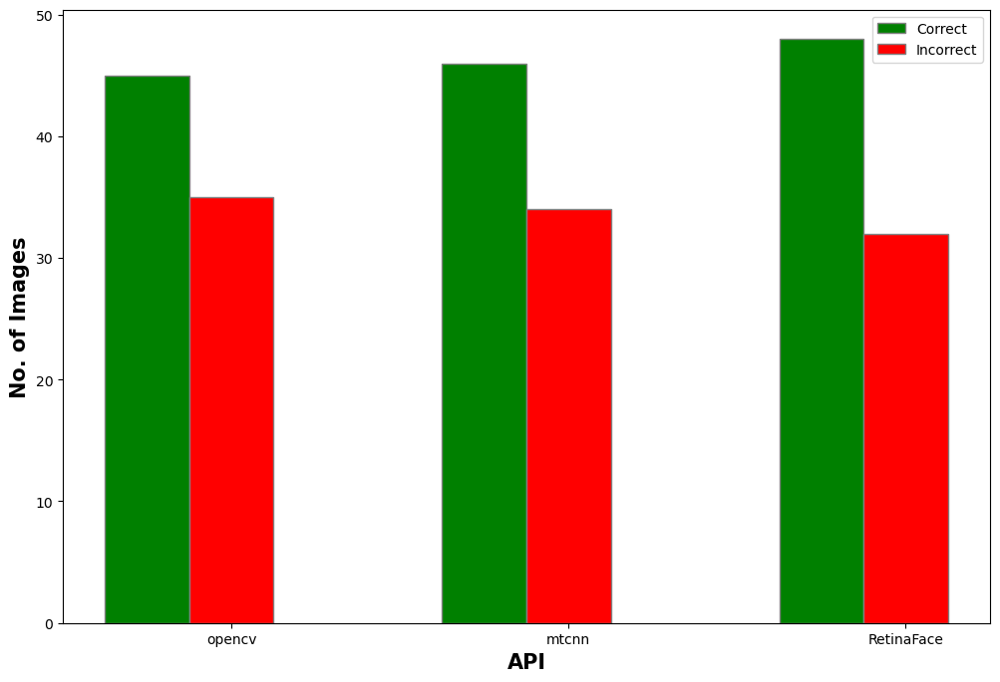

In [125]:
listOfDicts = {'opencv':BECompResOpenCV, 'mtcnn':BECompResMtcnn, 'retinaFace':BECompResRetFace}
category = 'gender'
DrawBarChart(category, listOfDicts)

### Face Alignment Conclusion 

In conclusion from the minimal testing (first 80 images of the FairFace dataset) of the opencv, mtcnn & retinaface backends for the DeepFace.analyze() function the mtcnn was found to produce the best overall results. This can be seen from the tabulated data below:

opencv
- age 26.2% correct
- gender 56.2% correct
- race 66.3% correct

mtcnn
- age 26.2% correct
- gender 58.7% correct
- race 68.8% correct

retinaface
- age 22.5% correct
- gender 58.7% correct
- race 65% correct

This is also further supported by the follwoing claim made in the [DeepFace](https://github.com/serengil/deepface) github repo: 
- "RetinaFace and MTCNN seem to overperform in detection and alignment stages but they are much slower. If the speed of your pipeline is more important, then you should use opencv or ssd. On the other hand, if you consider the accuracy, then you should use retinaface or mtcnn."

The above claim is in line with the output provided in this notebook however retinaface seems to be producing subpar results given the particuals FairFace dataset images

# Testing CLIP parameters

In [45]:
# Function which measures the similarity between two images
def ImageSimilarity(img1, img2, threshold=1000):
    
    # Checking if the images have the same dimensions
    if img1.shape != img2.shape:
        return False

    # Calculate the Mean Squared Error (MSE)
    mse = ((img1 - img2) ** 2).mean()

    # Compare MSE with threshold
    return mse < threshold

In [46]:
# Using Aesthetic score of 0 & aesthetic weight of 0 as a basline
text = "Real Female Human Doctor"
aes_scores = [0,0,100,100,55]
aes_weights = [0,100,0,100,74]
num_of_images = 100 

ClipParamsDict = {}

for index in range(len(aes_scores)):
    if len(aes_scores) == len(aes_weights):
        listOfImages = retrieveImages(text, aes_scores[index], aes_weights[index], num_of_images)
        
        ClipParamsImgs = []
        
        for img_url in listOfImages:
            try:
                image_data = urllib.request.urlopen(img_url['url'])

                img = plt.imread(image_data, format='jpg')

                ClipParamsImgs.append(img)
            except Exception as error:
                print("[Val Pair "+str(index)+"] "+str(error))
        
        ClipParamsDict[index] = ClipParamsImgs

[Val Pair 0] HTTP Error 403: Forbidden
[Val Pair 0] HTTP Error 404: Not Found
[Val Pair 0] <urlopen error [Errno 11001] getaddrinfo failed>
[Val Pair 0] HTTP Error 403: Forbidden
[Val Pair 0] HTTP Error 403: Forbidden
[Val Pair 0] HTTP Error 403: Forbidden
[Val Pair 1] HTTP Error 403: Forbidden
[Val Pair 1] HTTP Error 404: Not Found
[Val Pair 1] <urlopen error [Errno 11001] getaddrinfo failed>
[Val Pair 1] HTTP Error 403: Forbidden
[Val Pair 1] HTTP Error 403: Forbidden
[Val Pair 1] <urlopen error [WinError 10060] A connection attempt failed because the connected party did not properly respond after a period of time, or established connection failed because connected host has failed to respond>
[Val Pair 1] HTTP Error 403: Forbidden
[Val Pair 2] HTTP Error 403: Forbidden
[Val Pair 2] HTTP Error 404: Not Found
[Val Pair 2] <urlopen error [Errno 11001] getaddrinfo failed>
[Val Pair 2] HTTP Error 403: Forbidden
[Val Pair 2] HTTP Error 403: Forbidden
[Val Pair 2] <urlopen error [WinError 1

In [47]:
for index in range(len(ClipParamsDict)):
    for listIndex in range(len(ClipParamsDict[index])-1):
        indice_1 = index
        indice_2 = (index+1)%len(ClipParamsDict)
    
        if not ImageSimilarity(ClipParamsDict[indice_1][listIndex],ClipParamsDict[indice_2][listIndex]):
            print("Image in [" + str(indice_1) + "," + str(listIndex) + "] doesn't match with [" + str(indice_2) + "," + str(listIndex) + ']')

Image in [0,64] doesn't match with [1,64]
Image in [0,65] doesn't match with [1,65]
Image in [0,66] doesn't match with [1,66]
Image in [0,67] doesn't match with [1,67]
Image in [2,64] doesn't match with [3,64]
Image in [2,65] doesn't match with [3,65]
Image in [2,66] doesn't match with [3,66]


### CLIP parameters

In conclusion from the testing carried out above the aes_weight & aes_score variables do not seem to have any affect on the images retrieved for the queries being utilised throughout this notebook. This was concluded as irrelvant of the paramaters passed the resulatant output was consistently the same.